In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Correlation and Distribution

In [63]:
df = pd.read_csv(('../00_data/04_output/FsAMIs_pop_bestk.csv'))


factors = ["DEP", "ED", 'DIS', 'SP', "MHP","GDP",'INT']

df_select = df.loc[df['factor'].isin(factors)]
dfp = df_select.pivot(index=["cbsacode"], columns="factor", values='FsAMI').reset_index()
dfp = dfp[['cbsacode'] + factors]
df_cleaned = dfp.dropna()
print(df_cleaned.shape)
df_raw = pd.read_csv("../00_data/03_final/cbsa_level.csv")
df_raw = df_raw.rename(columns={
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
})

# Drop missing values and isolate data matrix
df_cleaned = df_cleaned.merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='left')
print(df_cleaned.shape)

# Data for plotting (factors + population kept for size mapping)
factor_cols = factors
df_plot = df_cleaned[['TotalPopulation'] + factor_cols].copy()

(826, 8)
(826, 9)


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from scipy.stats import spearmanr, gaussian_kde

# --- INPUTS ---
# df_plot: DataFrame with ['TotalPopulation'] + factor_cols
# factor_cols: e.g., ["DEP","ED","PI","MHP","GDP","NOI"]

sns.set_theme(style="ticks", font_scale=1.25)
plt.rc("font", family="Arial")
plt.rcParams.update({
    "figure.dpi": 300,
    "axes.linewidth": 1.2,          # crisp box edges
    "axes.autolimit_mode": "round_numbers",  # round to nice tick limits
    "axes.xmargin": 0,              # remove x padding
    "axes.ymargin": 0,              # remove y padding
    "xtick.direction": "out",
    "ytick.direction": "out",
    "axes.labelsize": 24,
})

# --- Scale point size by population ---
pop = df_plot["TotalPopulation"].astype(float)
pop_norm = (pop - pop.min()) / (pop.max() - pop.min() + 1e-12)
size_min, size_max = 20, 200   # adjust here
sizes_all = size_min + pop_norm * (size_max - size_min)

# --- Compute per-variable limits (for consistent scale per factor) ---
pad_frac = 0.06
var_stats = {}
for v in factor_cols:
    a = df_plot[v].to_numpy()
    m = np.isfinite(a)
    vmin, vmax = np.min(a[m]), np.max(a[m])
    span = vmax - vmin if vmax > vmin else 1.0
    var_stats[v] = dict(min=vmin, max=vmax, span=span, ctr=0.5 * (vmin + vmax))

# --- Modified equal_span_limits (use each variable’s own consistent range) ---
def equal_span_limits(vx, vy):
    """Return limits based only on each variable's fixed min/max range."""
    return (var_stats[vx]["min"], var_stats[vx]["max"]), (var_stats[vy]["min"], var_stats[vy]["max"])

def draw_quantile_contours(ax, x, y, quantiles=(0.5, 0.9), gridsize=200):
    import numpy as np
    from scipy.stats import gaussian_kde

    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 10:
        return
    x, y = np.asarray(x)[m], np.asarray(y)[m]

    # use current visible limits
    xlim, ylim = ax.get_xlim(), ax.get_ylim()

    xi = np.linspace(xlim[0], xlim[1], gridsize)
    yi = np.linspace(ylim[0], ylim[1], gridsize)
    xx, yy = np.meshgrid(xi, yi)

    try:
        kde = gaussian_kde(np.vstack([x, y]))
    except Exception:
        return

    zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(gridsize, gridsize)

    dx = (xlim[1] - xlim[0]) / (gridsize - 1)
    dy = (ylim[1] - ylim[0]) / (gridsize - 1)
    area = dx * dy
    z_sorted = np.sort(zz.ravel())[::-1]
    cumsum = np.cumsum(z_sorted * area)
    total = cumsum[-1] if cumsum.size else 1.0

    def level_at(q):
        idx = np.searchsorted(cumsum, q * total, side="left")
        return z_sorted[min(idx, len(z_sorted) - 1)]

    qs = [q for q in quantiles if 0 < q < 1]
    if not qs:
        return

    levels = np.unique(np.sort([level_at(q) for q in qs])[::-1])
    if levels.size == 0:
        return

    lws = np.linspace(2.0, 1.0, num=len(levels))
    cs = ax.contour(xx, yy, zz, levels=levels, colors="red", linewidths=lws)
    for c in cs.collections:
        c.set_zorder(3)
        c.set_clip_on(True)

# --- Layout ---
n = len(factor_cols)
cell = 3
fig, axes = plt.subplots(n, n, figsize=(cell * n + 10, cell * n + 2.5))
plt.subplots_adjust(wspace=0.1, hspace=0.1)

# --- Spearman color map ---
cmap = plt.get_cmap("coolwarm")
norm = Normalize(vmin=-1, vmax=1)
sm = ScalarMappable(norm=norm, cmap=cmap)

for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        xi, yi = factor_cols[j], factor_cols[i]

        
        if i == j:
            # --- Histogram ---
            sns.histplot(df_plot[yi], bins=15, edgecolor="black", linewidth=0.5, ax=ax)
            ax.grid(False)

            # --- Label (italic Arial) ---
            ax.set_xlabel(xi, fontsize=24, fontstyle='italic', fontfamily='Arial')
            ax.set_ylabel('Count', fontsize=24, fontfamily='Arial')

            # --- 数据范围 & 对齐到 0.05 倍数 ---
            xmin, xmax = np.nanmin(df_plot[yi]), np.nanmax(df_plot[yi])
            tick_min = np.floor(xmin / 0.05) * 0.05
            tick_max = np.ceil(xmax / 0.05) * 0.05
            if tick_max == tick_min:
                tick_min -= 0.05
                tick_max += 0.05

            # --- 留白 ---
            span = tick_max - tick_min
            pad = 0
            ax.set_xlim(tick_min - pad, tick_max + pad)

            # --- 三个刻度：最小、中间、最大 ---
            xticks = [tick_min, 0.0, tick_max] if tick_min < 0 < tick_max else np.linspace(tick_min, tick_max, 3)
            ax.set_xticks(xticks)
            ax.set_xticklabels([f"{t:.2f}" for t in xticks], fontsize=24)

            # --- y轴 ---
            ymin, ymax = ax.get_ylim()
            ytick_min = 0
            ytick_max = np.ceil(ymax / 10) * 10
            ypad = 0
            ax.set_ylim(ytick_min - ypad, ytick_max + ypad)
            yticks = np.linspace(ytick_min, ytick_max, 3)
            ax.set_yticks(yticks)
            ax.set_yticklabels([f"{t:.0f}" for t in yticks], fontsize=24)

            ax.tick_params(axis="both", which="both", direction="out", length=10, width=1.0, labelsize=24)
            

        elif i > j:
            x = df_plot[xi].to_numpy()
            y = df_plot[yi].to_numpy()
            m = np.isfinite(x) & np.isfinite(y)
            x, y, s = x[m], y[m], sizes_all[m]

            # --- X轴: 对齐到 0.05 倍数 + 留白 ---
            xmin, xmax = np.min(x), np.max(x)
            x_tick_min = np.floor(xmin / 0.05) * 0.05
            x_tick_max = np.ceil(xmax / 0.05) * 0.05
            if x_tick_max == x_tick_min:
                x_tick_min -= 0.05
                x_tick_max += 0.05
            x_span = x_tick_max - x_tick_min
            x_pad = 0
            ax.set_xlim(x_tick_min - x_pad, x_tick_max + x_pad)

            if x_tick_min < 0 < x_tick_max:
                xticks = [x_tick_min, 0.0, x_tick_max]
            else:
                xticks = np.linspace(x_tick_min, x_tick_max, 3)
            ax.set_xticks(xticks)
            ax.set_xticklabels([f"{t:.2f}" for t in xticks], fontsize=24)

            # --- Y轴: 对齐到 0.05 倍数 + 留白 ---
            ymin, ymax = np.min(y), np.max(y)
            y_tick_min = np.floor(ymin / 0.05) * 0.05
            y_tick_max = np.ceil(ymax / 0.05) * 0.05
            if y_tick_max == y_tick_min:
                y_tick_min -= 0.05
                y_tick_max += 0.05
            y_span = y_tick_max - y_tick_min
            y_pad = 0
            ax.set_ylim(y_tick_min - y_pad, y_tick_max + y_pad)

            if y_tick_min < 0 < y_tick_max:
                yticks = [y_tick_min, 0.0, y_tick_max]
            else:
                yticks = np.linspace(y_tick_min, y_tick_max, 3)
            ax.set_yticks(yticks)
            ax.set_yticklabels([f"{t:.2f}" for t in yticks], fontsize=24)

            # --- scatter + contours ---
            ax.scatter(x, y, s=s, alpha=0.4, edgecolor="black", linewidths=0.5)
            draw_quantile_contours(ax, x, y, quantiles=(0.5, 0.9), gridsize=220)

            ax.grid(False)
            ax.set_xlabel(xi, fontsize=24, fontstyle='italic', fontfamily='Arial')
            ax.set_ylabel(yi, fontsize=24, fontstyle='italic', fontfamily='Arial')
            ax.tick_params(axis="both", which="both", direction="out", length=10, width=1.0, labelsize=24)


        else:
            # Upper triangle: Spearman correlation tile
            x = df_plot[xi].to_numpy()
            y = df_plot[yi].to_numpy()
            m = np.isfinite(x) & np.isfinite(y)

            rho, p = spearmanr(x[m], y[m])

            ax.imshow([[rho]], extent=[0, 1, 0, 1], cmap=cmap, norm=norm, aspect="equal")

            # text
            rho_txt = rf"$\rho$ = {rho:.3f}" if np.isfinite(rho) else r"$\rho$ = --"
            if np.isfinite(p) and p < 1e-3:
                p_txt = r"$p$ < 0.001" 
            else:
                p_txt = rf"$p$ = {p:.3f}" if np.isfinite(p) else r"$p$ = --"

            ax.text(0.5, 0.58, rho_txt, ha="center", va="center",
                    fontsize=24, color="black", transform=ax.transAxes)
            ax.text(0.5, 0.38, p_txt, ha="center", va="center",
                    fontsize=24, color="black", transform=ax.transAxes)

            ax.set_xticks([]); ax.set_yticks([])
            for s in ax.spines.values():
                s.set_visible(False)
            if i == n - 1: ax.set_xlabel(xi)
            if j == 0: ax.set_ylabel(yi)

# --- Colorbar ---
cax = fig.add_axes([0.92, 0.12, 0.02, 0.76])
cb = fig.colorbar(sm, cax=cax)
cb.ax.tick_params(labelsize=24, length=10, width=1.0)
cb.set_label(rf"Spearman $\rho$",fontsize=24)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.savefig("scatter.pdf", dpi=300, bbox_inches='tight')
plt.show()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_36676\3805229906.py:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_36676\3805229906.py:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_36676\3805229906.py:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_36676\3805229906.py:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_36676\3805229906.py:90: Matplot

In [76]:
df = pd.read_csv(('../00_data/04_output/FsAMIs_pop_bestk.csv'))


factors = ["DEP"]

df_select = df.loc[df['factor'].isin(factors)]
dfp = df_select.pivot(index=["cbsacode"], columns="factor", values='FsAMI').reset_index()
dfp = dfp[['cbsacode'] + factors]
df_cleaned = dfp.dropna()
print(df_cleaned.shape)
df_raw = pd.read_csv("../00_data/03_final/cbsa_level.csv")
df_raw = df_raw.rename(columns={
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
})

# Drop missing values and isolate data matrix
df_cleaned = df_cleaned.merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='left')
print(df_cleaned.shape)

# Data for plotting (factors + population kept for size mapping)
factor_cols = factors
df_plot = df_cleaned[['TotalPopulation','cbsacode'] + factor_cols].copy()
import geopandas as gpd
gdf = gpd.read_file("../00_data/01_raw/tl_2024_us_cbsa", engine="pyogrio")
gdf['cbsacode'] = gdf['CBSAFP'].astype('float64')
gdf_ll = gdf.to_crs("EPSG:4326").copy()

(875, 2)
(875, 3)


In [93]:
df_sami = pd.read_csv("../00_data/04_output/SAMIs_pop.csv")
df_sami = df_sami.loc[df_sami['factor']=="DEPRESSION"].copy()

df_sami = df_sami.merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='left')

In [95]:
# -------------------- Prepare merged data --------------------
sami_plot = gdf_ll.merge(df_sami[['cbsacode','SAMI','TotalPopulation']], how='left')
fsami_plot = gdf_ll.merge(df_plot[['cbsacode','DEP','TotalPopulation']], how='left')

In [80]:
states_gdf = gpd.read_file("../00_data/01_raw/cb_2018_us_state_500k", engine="pyogrio")
states_mainland = states_gdf[
    ~states_gdf["NAME"].isin(["Alaska", "Hawaii", "Puerto Rico"])
]
states_mainland = states_gdf.to_crs(gdf_ll.crs)


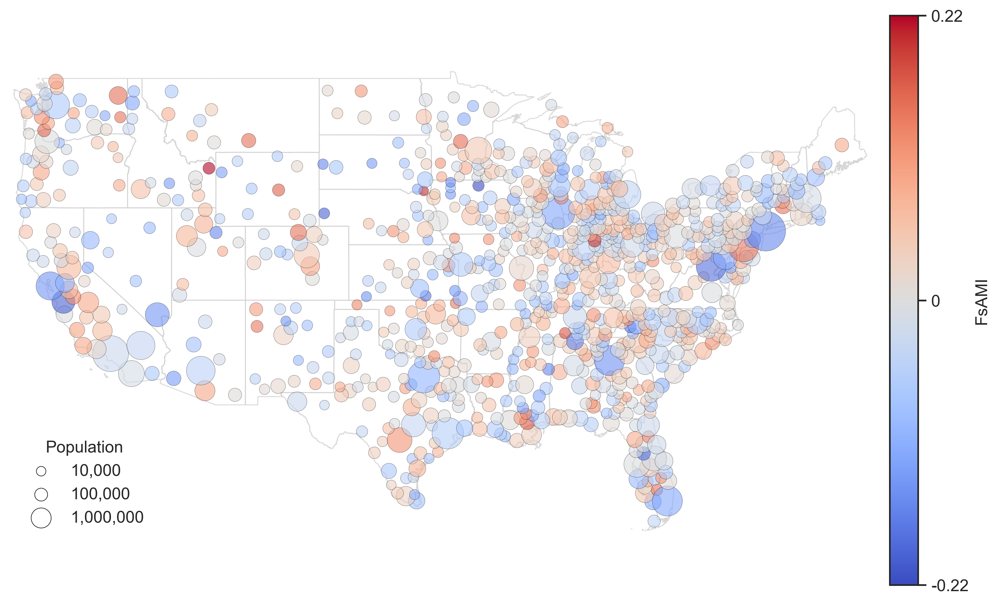

In [104]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd
from shapely.geometry import box
import numpy as np

# -------------------------------------------------------
# INPUTS:
# gdf_ll   : CBSA polygons (with 'cbsacode')
# df       : table with ['cbsacode', 'FsAMI', <population_col>]
# states_gdf : US state polygons
# -------------------------------------------------------

# 0. Settings
pop_col = "TotalPopulation"   # <-- change to your population column name
cmap = "coolwarm"


# -------------------- Create CONUS bounding box --------------------
conus_bounds = (-125, 24, -66, 50)
conus_poly = gpd.GeoDataFrame(
    geometry=[box(*conus_bounds)],
    crs=gdf_ll.crs
)

# -------------------- Clip polygons & states to CONUS --------------------
fsami_clip = fsami_plot.clip(conus_poly)

states_gdf = states_mainland.to_crs(gdf_ll.crs)
states_clip = states_mainland.clip(conus_poly)

# -------------------- Centroids for dot positions --------------------
# (Optional but safer) compute centroids in a projected CRS, then back to lat/lon
proj_crs = "EPSG:5070"  # US Albers (good for CONUS)
fsami_proj = fsami_clip.to_crs(proj_crs)
fsami_proj["centroid"] = fsami_proj.geometry.centroid
centroids = fsami_proj.set_geometry("centroid").to_crs(gdf_ll.crs)

# Extract x, y for scatter
xs = centroids.geometry.x
ys = centroids.geometry.y

# -------------------- Dot size scaling by population --------------------
pop = centroids[pop_col].fillna(0)

k_min, k_max = 30, 300 

pop_safe = pop.fillna(0)

if pop_safe.max() > 0:
    pop_norm = np.sqrt(pop_safe / pop_safe.max())
else:
    pop_norm = np.zeros_like(pop_safe)

sizes = k_min + (k_max - k_min) * pop_norm * 3

# -------------------- Symmetric color scale for FsAMI --------------------
fs = centroids["DEP"]
fs_min = np.nanmin(fs)
fs_max = np.nanmax(fs)
vmax = max(abs(fs_min), abs(fs_max))
vmin = -vmax  # symmetric

# -------------------- Plot --------------------
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# State boundaries (light gray background)
states_clip.boundary.plot(
    ax=ax,
    color="lightgray",
    linewidth=0.7,
    alpha=0.8,
    zorder=1
)

# CBSA centroids as dots
sc = ax.scatter(
    xs, ys,
    c=fs,
    s=sizes,
    cmap=cmap,
    vmin=vmin, vmax=vmax,
    edgecolor="black",
    linewidth=0.2,
    alpha=0.6,
    zorder=2
)

ax.set_axis_off()

# -------------------- Colorbar (symmetric, ticks at edges) --------------------
sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="vertical",
    fraction=0.035,
    pad=0.01
)

# ticks at edges + 0 in middle
cbar.set_ticks([vmin, 0, vmax])
cbar.set_ticklabels([f"{vmin:.2f}", "0", f"{vmax:.2f}"])
cbar.ax.set_ylabel("FsAMI", fontsize=12)
cbar.ax.tick_params(labelsize=12)

for spine in ["top", "right", "left", "bottom"]:
    cbar.ax.spines[spine].set_visible(False)

# -------------------- Legend for dot size (population) --------------------
# choose a few reference populations
ref_pops = [10000,100000,1000000]

handles = []
labels = []

for rp in ref_pops:
    # 用和实际点一样的缩放方式算 legend 的半径
    rp_norm = np.sqrt(rp / pop_safe.max())
    rp_size = k_min + (k_max - k_min) * rp_norm *3

    h = ax.scatter(
        [], [],            # 空数据，只用来画 legend 符号
        s=rp_size,
        edgecolor="black",
        facecolor="none",
        linewidth=0.4
    )
    handles.append(h)
    labels.append(f"{int(rp):,}")  # 带千分位：200,000 / 1,000,000 / ...

ax.legend(
    handles,
    labels,
    title="Population",
    scatterpoints=1,
    frameon=False,
    loc="lower left",   # 视图里找个不挡图的位置
    fontsize=12,
    title_fontsize=12
)

# -------------------- Fix extent to CONUS --------------------
xmin, ymin, xmax, ymax = conus_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# -------------------- Export --------------------
fig.savefig("FSAMI_map.pdf", format="pdf", bbox_inches="tight")
plt.show()



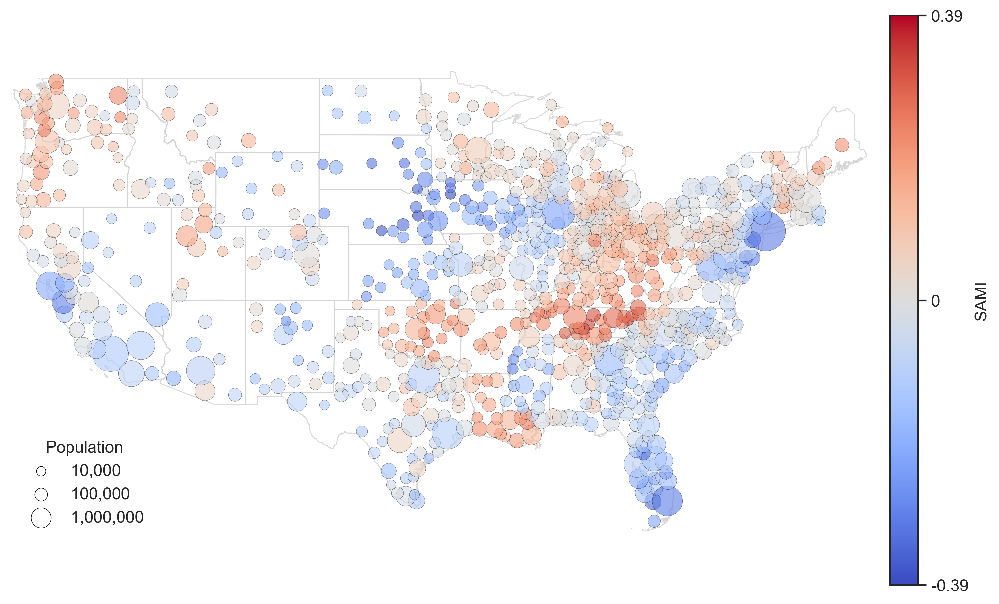

In [105]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd
from shapely.geometry import box
import numpy as np

# -------------------------------------------------------
# INPUTS:
# gdf_ll   : CBSA polygons (with 'cbsacode')
# df       : table with ['cbsacode', 'FsAMI', <population_col>]
# states_gdf : US state polygons
# -------------------------------------------------------

# 0. Settings
pop_col = "TotalPopulation"   # <-- change to your population column name
cmap = "coolwarm"


# -------------------- Create CONUS bounding box --------------------
conus_bounds = (-125, 24, -66, 50)
conus_poly = gpd.GeoDataFrame(
    geometry=[box(*conus_bounds)],
    crs=gdf_ll.crs
)

# -------------------- Clip polygons & states to CONUS --------------------
fsami_clip = sami_plot.clip(conus_poly)

states_gdf = states_mainland.to_crs(gdf_ll.crs)
states_clip = states_mainland.clip(conus_poly)

# -------------------- Centroids for dot positions --------------------
# (Optional but safer) compute centroids in a projected CRS, then back to lat/lon
proj_crs = "EPSG:5070"  # US Albers (good for CONUS)
fsami_proj = fsami_clip.to_crs(proj_crs)
fsami_proj["centroid"] = fsami_proj.geometry.centroid
centroids = fsami_proj.set_geometry("centroid").to_crs(gdf_ll.crs)

# Extract x, y for scatter
xs = centroids.geometry.x
ys = centroids.geometry.y

# -------------------- Dot size scaling by population --------------------
pop = centroids[pop_col].fillna(0)

k_min, k_max = 30, 300 

pop_safe = pop.fillna(0)

if pop_safe.max() > 0:
    pop_norm = np.sqrt(pop_safe / pop_safe.max())
else:
    pop_norm = np.zeros_like(pop_safe)

sizes = k_min + (k_max - k_min) * pop_norm * 3

# -------------------- Symmetric color scale for FsAMI --------------------
fs = centroids["SAMI"]
fs_min = np.nanmin(fs)
fs_max = np.nanmax(fs)
vmax = max(abs(fs_min), abs(fs_max))
vmin = -vmax  # symmetric

# -------------------- Plot --------------------
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# State boundaries (light gray background)
states_clip.boundary.plot(
    ax=ax,
    color="lightgray",
    linewidth=0.7,
    alpha=0.8,
    zorder=1
)

# CBSA centroids as dots
sc = ax.scatter(
    xs, ys,
    c=fs,
    s=sizes,
    cmap=cmap,
    vmin=vmin, vmax=vmax,
    edgecolor="black",
    linewidth=0.2,
    alpha=0.6,
    zorder=2
)

ax.set_axis_off()

# -------------------- Colorbar (symmetric, ticks at edges) --------------------
sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="vertical",
    fraction=0.035,
    pad=0.01
)

# ticks at edges + 0 in middle
cbar.set_ticks([vmin, 0, vmax])
cbar.set_ticklabels([f"{vmin:.2f}", "0", f"{vmax:.2f}"])
cbar.ax.set_ylabel("SAMI", fontsize=12)
cbar.ax.tick_params(labelsize=12)

for spine in ["top", "right", "left", "bottom"]:
    cbar.ax.spines[spine].set_visible(False)

# -------------------- Legend for dot size (population) --------------------
# choose a few reference populations
ref_pops = [10000,100000,1000000]

handles = []
labels = []

for rp in ref_pops:
    rp_norm = np.sqrt(rp / pop_safe.max())
    rp_size = k_min + (k_max - k_min) * rp_norm * 3

    h = ax.scatter(
        [], [],           
        s=rp_size,
        edgecolor="black",
        facecolor="none",
        linewidth=0.4
    )
    handles.append(h)
    labels.append(f"{int(rp):,}")  

ax.legend(
    handles,
    labels,
    title="Population",
    scatterpoints=1,
    frameon=False,
    loc="lower left",  
    fontsize=12,
    title_fontsize=12
)

# -------------------- Fix extent to CONUS --------------------
xmin, ymin, xmax, ymax = conus_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# -------------------- Export --------------------
fig.savefig("SAMI_map.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [90]:
ref_pops

array([  29000.,  390000., 5300000.])

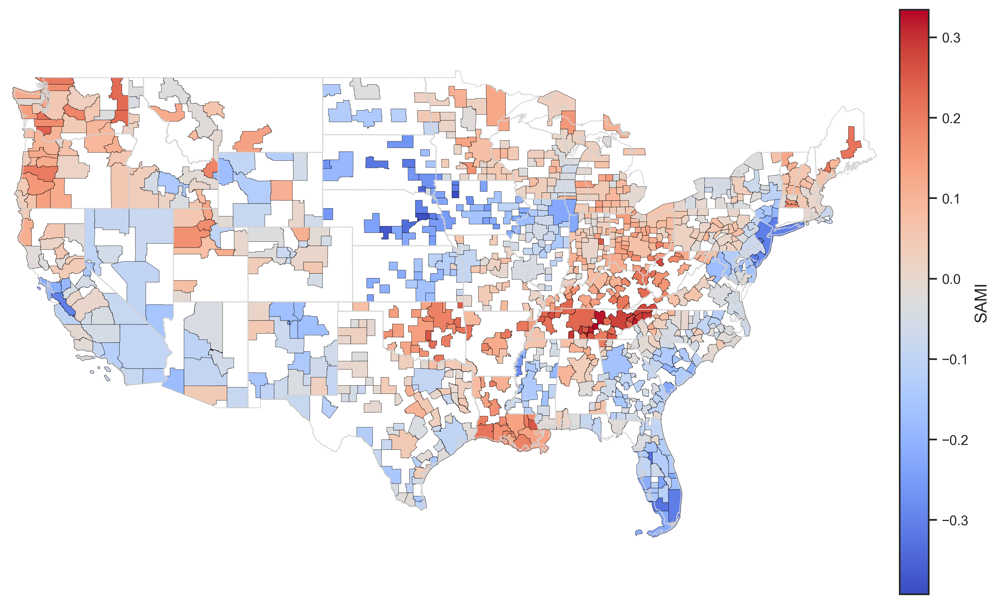

In [60]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import geopandas as gpd
from shapely.geometry import box
import numpy as np

# -------------------------------------------------------
# INPUTS:
# gdf_ll   : CBSA polygons (geometry + cbsacode)
# df_sami  : table containing ['cbsacode', 'SAMI']
# states_gdf : US state polygons (shapefile)
# CRS should be geographic (e.g., EPSG:4326) or consistent.
# -------------------------------------------------------

# -------------------- Merge SAMI data --------------------
sami_plot = gdf_ll.merge(df_sami[['cbsacode', 'SAMI']], how='left')

# -------------------- Create CONUS bounding box --------------------
# Lower-48 bounding box
conus_bounds = (-125, 24, -66, 50)
conus_poly = gpd.GeoDataFrame(
    geometry=[box(*conus_bounds)],
    crs=gdf_ll.crs     # make sure CRS matches gdf_ll
)

# -------------------- Clip CBSA + states to CONUS --------------------
sami_clip = sami_plot.clip(conus_poly)

states_gdf = states_gdf.to_crs(gdf_ll.crs)
states_clip = states_gdf.clip(conus_poly)

# -------------------- Color scale --------------------
vmin = sami_clip["SAMI"].min()
vmax = sami_clip["SAMI"].max()
cmap = "coolwarm"   # same as FSAMI figure

# -------------------- Plot --------------------
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

# SAMI polygons
sami_clip.plot(
    column="SAMI",
    cmap=cmap,
    vmin=vmin, vmax=vmax,
    linewidth=0.2,
    edgecolor="black",
    ax=ax
)

# State boundaries (light gray)
states_clip.boundary.plot(
    ax=ax,
    color="lightgray",
    linewidth=0.7,
    alpha=0.8,
    zorder=3
)

# Clean academic style
ax.set_axis_off()

# -------------------- Colorbar --------------------
sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="vertical",
    fraction=0.035,
    pad=0.01
)
cbar.ax.set_ylabel("SAMI", fontsize=12)
cbar.ax.tick_params(labelsize=10)

for spine in ["top", "right", "left", "bottom"]:
    cbar.ax.spines[spine].set_visible(False)

# -------------------- Fix extent so map fills figure --------------------
xmin, ymin, xmax, ymax = conus_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# -------------------- Export (Vector PDF + EPS) --------------------
fig.savefig("SAMI_map.pdf", format="pdf", bbox_inches="tight")           # vector


plt.show()


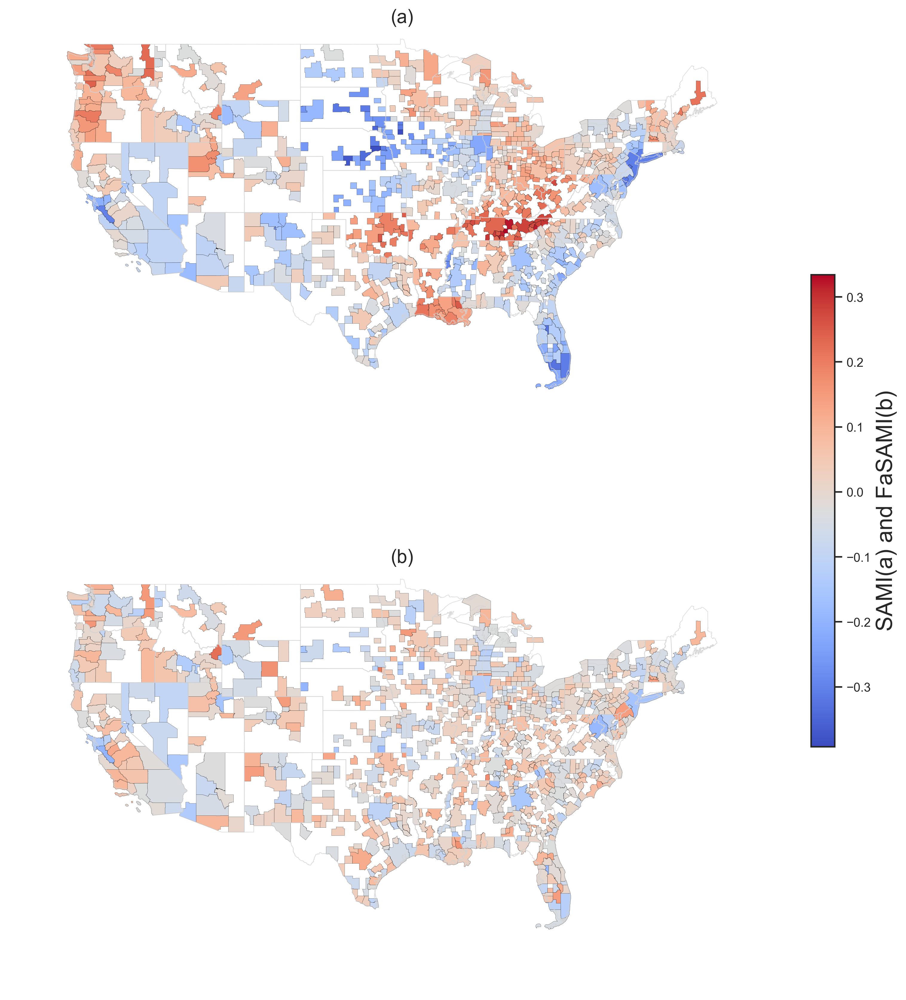

In [56]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np



# -------------------- Unified color scale --------------------
vmin = np.nanmin([sami_clip["SAMI"].min(), fsami_clip["FsAMI"].min()])
vmax = np.nanmax([sami_clip["SAMI"].max(), fsami_clip["FsAMI"].max()])

# Nature/Science-like diverging colormap
cmap = "coolwarm"

# -------------------- Figure --------------------

fig, axes = plt.subplots(
    2, 1, figsize=(10, 12),
    constrained_layout=True
)

# ================== Helper to draw each map ==================
def draw_panel(ax, gdf, column, title):

     # State boundaries (light gray, thin)
    states_clip.boundary.plot(
        ax=ax,
        color="lightgray",
        linewidth=0.5,
        zorder=3,
        alpha=0.7
    )
    # Metro polygons
    gdf.plot(
        column=column,
        cmap=cmap,
        vmin=vmin, vmax=vmax,
        linewidth=0.1,
        edgecolor="black",
        ax=ax
    )

    ax.set_axis_off()
    ax.set_title(title, fontsize=15, pad=6)

# -------------------- (a) SAMI --------------------
draw_panel(
    axes[0],
    sami_clip,
    "SAMI",
    "(a)"
)

# -------------------- (b) FSAMI --------------------
draw_panel(
    axes[1],
    fsami_clip,
    "FsAMI",
    "(b)"
)

# -------------------- Unified colorbar --------------------
sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation="vertical",
    fraction=0.03,
    pad=0.02
)
cbar.ax.set_ylabel("SAMI(a) and FaSAMI(b)", fontsize=18)
cbar.ax.tick_params(labelsize=10)

# Remove spines 
for spine in ["top", "right", "left", "bottom"]:
    cbar.ax.spines[spine].set_visible(False)

# -------------------- Export --------------------
fig.savefig("FsAMI_SAMI_maps.pdf", format="pdf", bbox_inches="tight")  # vector PDF

plt.show()


## Moran's I

In [17]:
df_plot

,Unnamed: 0,factor,k,baseline_moran_value,baseline_moran_p,final_moran_value,final_moran_p,selected_m_eigs,beta,p_value,CI_lower,CI_upper,AIC,BIC,AICc,CV_RMSE_final,LASSO_R2_unused,LASSO_n_eigs_unused,baseline_ci,final_ci
1749,2624,DEP,9,0.701234,0.001,0.029164,0.055,66,0.993780,0.0,0.989925,0.997635,-2188.492209,-1863.844985,-2176.849529,0.069514,0.362191,142,0.417682,0.029789
1173,2048,DEP,9,0.701234,0.001,0.029164,0.055,66,0.993780,0.0,0.989925,0.997635,-2188.492209,-1863.844985,-2176.849529,0.069514,0.362191,142,0.417682,0.029789
1172,2047,DEP,9,0.701234,0.001,0.029164,0.055,66,0.993780,0.0,0.989925,0.997635,-2188.492209,-1863.844985,-2176.849529,0.069514,0.362191,142,0.417682,0.029789
1171,2046,DEP,9,0.701234,0.001,0.029164,0.055,66,0.993780,0.0,0.989925,0.997635,-2188.492209,-1863.844985,-2176.849529,0.069514,0.362191,142,0.417682,0.029789
1170,2045,DEP,9,0.701234,0.001,0.029164,0.055,66,0.993780,0.0,0.989925,0.997635,-2188.492209,-1863.844985,-2176.849529,0.069514,0.362191,142,0.417682,0.029789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5527,38145,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.000000,0,0.293312,0.041804
5528,38146,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.000000,0,0.293312,0.041804
5529,38147,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.000000,0,0.293312,0.041804
5519,38137,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.000000,0,0.293312,0.041804


In [22]:
df_models

,Unnamed: 0,factor,k,baseline_moran_value,baseline_moran_p,final_moran_value,final_moran_p,selected_m_eigs,beta,p_value,CI_lower,CI_upper,AIC,BIC,AICc,CV_RMSE_final,LASSO_R2_unused,LASSO_n_eigs_unused
0,0,ED,11,0.653093,0.001,0.026501,0.063,44,1.022914,0.0,1.018191,1.027637,-1842.055484,-1622.441186,-1836.833262,0.084525,0.0,0
1,1,ED,11,0.653093,0.001,0.026501,0.063,44,1.022914,0.0,1.018191,1.027637,-1842.055484,-1622.441186,-1836.833262,0.084525,0.0,0
2,2,ED,11,0.653093,0.001,0.026501,0.063,44,1.022914,0.0,1.018191,1.027637,-1842.055484,-1622.441186,-1836.833262,0.084525,0.0,0
3,3,ED,11,0.653093,0.001,0.026501,0.063,44,1.022914,0.0,1.018191,1.027637,-1842.055484,-1622.441186,-1836.833262,0.084525,0.0,0
4,4,ED,11,0.653093,0.001,0.026501,0.063,44,1.022914,0.0,1.018191,1.027637,-1842.055484,-1622.441186,-1836.833262,0.084525,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6071,38689,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.0,0
6072,38690,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.0,0
6073,38691,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.0,0
6074,38692,INT,6,0.492433,0.001,0.040274,0.059,40,0.895658,0.0,0.874712,0.916603,758.120657,956.268454,762.727800,0.388157,0.0,0


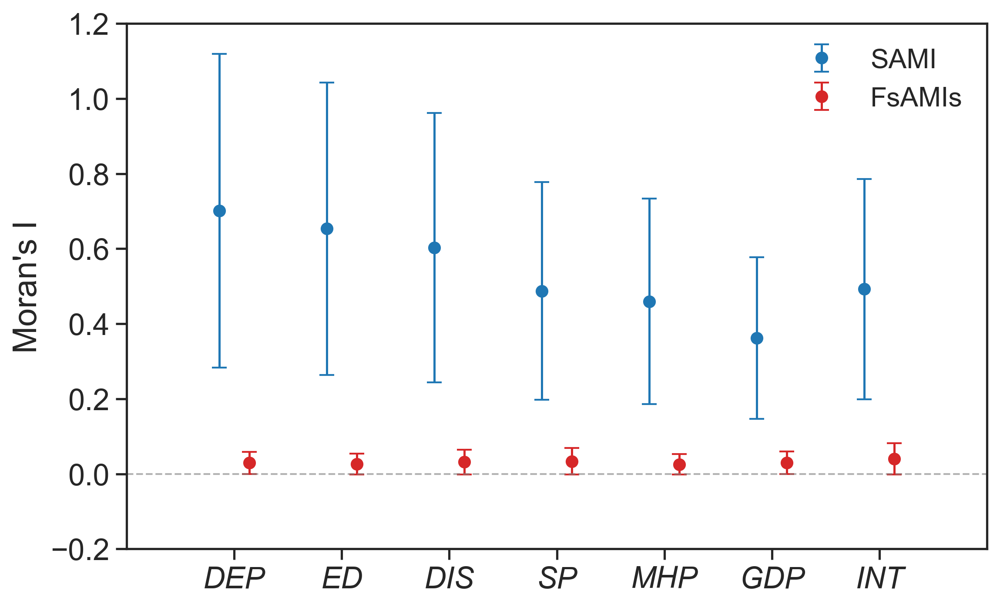

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

df = pd.read_csv(('../00_data/04_output/FsAMIs_pop_bestk.csv'))
factors = ["DEP", "ED", 'DIS', 'SP', "MHP","GDP",'INT']


df_models = df.loc[df['factor'].isin(factors)][['factor','baseline_moran_value',
                                                'baseline_moran_p','final_moran_value',
                                                'final_moran_p']].drop_duplicates().reset_index(drop=True)


df_plot = df_models.loc[df_models['factor'].isin(factors)].copy()
df_plot['factor'] = pd.Categorical(df_plot['factor'], categories=factors, ordered=True)
df_plot = df_plot.sort_values('factor')

# Derive 95% CI half-widths from p-values (two-sided normal approx around 0)
def ci_half_from_p(value, p, alpha=0.05):
    if pd.isna(value) or pd.isna(p) or p <= 0:
        p = 1e-16  # avoid inf
    z_obs = norm.isf(p/2.0)          # z such that P(|Z|>=z)=p
    se    = abs(value) / z_obs       # value ≈ z_obs * se  (testing against 0)
    z95   = norm.ppf(1 - alpha/2.0)  # 1.96
    return z95 * se

df_plot['baseline_ci'] = df_plot.apply(
    lambda r: ci_half_from_p(r['baseline_moran_value'], r['baseline_moran_p']), axis=1
)
df_plot['final_ci'] = df_plot.apply(
    lambda r: ci_half_from_p(r['final_moran_value'], r['final_moran_p']), axis=1
)

# ---- PLOT ----
sns.set_theme(style="ticks", font_scale=1.5)
fig, ax = plt.subplots(figsize=(8, 5))

x = np.arange(len(factors))
width = 0.28

ax.errorbar(
    x - width/2,
    df_plot['baseline_moran_value'],
    yerr=df_plot['baseline_ci'],
    fmt='o', capsize=4, elinewidth=1.2, linewidth=0,
    label="SAMI", color='tab:blue'
)
ax.errorbar(
    x + width/2,
    df_plot['final_moran_value'],
    yerr=df_plot['final_ci'],
    fmt='o', capsize=4, elinewidth=1.2, linewidth=0,
    label="FsAMIs", color='tab:red'
)

# zero reference
ax.axhline(0, color='gray', linewidth=1, linestyle='--', alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(factors, fontstyle="italic")
ax.set_ylabel("Moran's I")
ax.legend(loc="upper right", frameon=False, fontsize=15) 
plt.tight_layout()
plt.savefig("moranI.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
df_models